<img src="title.png" width=95%>

<img src="Sentiment.png" width="820" height="300">

In [1]:
# importing libraries and packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import re
from wordcloud import WordCloud
from collections import Counter

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix

import nltk 
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

<div style="background-color: #004c4c; color: white; padding: 20px; border-radius: 15px; text-align: center">
    <b>Load the dataset from</b>
    <a href="https://www.kaggle.com/datasets/suchintikasarkar/sentiment-analysis-for-mental-health" target="_blank">
        <b style="color: lightblue;">Mental Health Compiled Dataset</b>
    </a>
</div>

In [2]:
# Read and look at the data
mhdf = pd.read_csv('Combined Data.csv', index_col= 0)
mhdf

,statement,status
0,oh my gosh,Anxiety
1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,I've shifted my focus to something else but I'...,Anxiety
4,"I'm restless and restless, it's been a month n...",Anxiety
...,...,...
53038,Nobody takes me seriously I’ve (24M) dealt wit...,Anxiety
53039,"selfishness ""I don't feel very good, it's lik...",Anxiety
53040,Is there any way to sleep better? I can't slee...,Anxiety
53041,"Public speaking tips? Hi, all. I have to give ...",Anxiety


In [3]:
# shuffle the rows, reset the indices
mhdf = mhdf.sample(frac = 1).reset_index(drop = True)
mhdf

,statement,status
0,kaitlinmonroe aw that sound so fun i m so bumm...,Normal
1,i ve finally been put on med after year of pus...,Depression
2,Smaller stomach after hernia repair surgery [H...,Anxiety
3,Everyone talks about loving themselves these d...,Depression
4,think about something else. think about a hamb...,Normal
...,...,...
53038,Am I going to overdose? What should I do? Plea...,Suicidal
53039,I do not know what I would do without my mom h...,Depression
53040,i extremely hate this day it reminds me that n...,Depression
53041,NaN,Stress


In [4]:
# Count the occurrences of each status
label_counts = mhdf['status'].value_counts()
label_counts

status
Normal                  16351
Depression              15404
Suicidal                10653
Anxiety                  3888
Bipolar                  2877
Stress                   2669
Personality disorder     1201
Name: count, dtype: int64

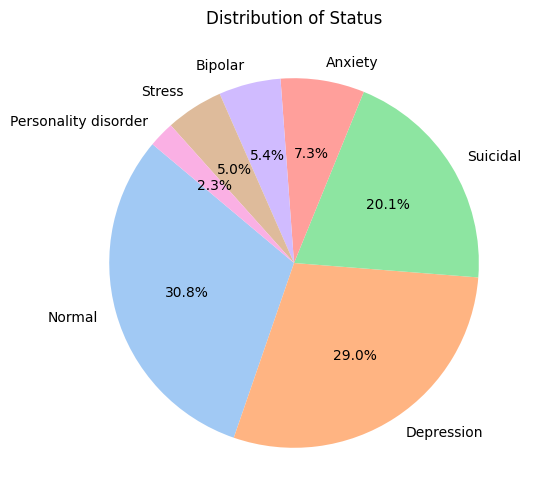

In [5]:
# Plot the pie chart
plt.figure(figsize=(6, 6))
plt.pie(label_counts, labels=label_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
plt.title('Distribution of Status');

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Preprocessing
</div>

In [6]:
# Missing values
mhdf.isnull().sum()

statement    362
status         0
dtype: int64

In [7]:
# drop records lacking the statement
mhdf.dropna(axis=0, inplace = True)

In [8]:
# Description of text data
mhdf.describe()

# top: the most frequently occurring in a column
# freq: how many times the top value appears in the column

,statement,status
count,52681,52681
unique,51073,7
top,what do you mean?,Normal
freq,22,16343



<div style="width: 92%; padding: 20px; 
            background: radial-gradient(circle,white, #E6E6FA, #D8BFD8);
            border: 2px solid #C8A2C8; 
            color: #3e1d2b ;
            font-size: 18px;
            border-radius: 15px;
            text-align: left;"> 
It's possible for the same statement to have different status labels.  This can lead to confusion in classification and introduce noise into the dataset.
</div>

In [9]:
# Count unique statuses for each statement
duplicate_labels = mhdf.groupby('statement')['status'].nunique()

# Filter statements with more than one unique status
conflicting_statements = duplicate_labels[duplicate_labels != 1]

# Display problematic statements
print(len(conflicting_statements))

18


In [10]:
# Remove rows with confilicting labels, only keep statements that have a single consistent status

mhdf = mhdf[mhdf.groupby('statement')['status'].transform('nunique') == 1]

print(mhdf.shape)  # Check new dataset size

(52632, 2)


<div style="width: 92%; padding: 20px; 
            background: radial-gradient(circle,white, #E6E6FA, #D8BFD8);
            border: 2px solid #C8A2C8; 
            color: #3e1d2b ;
            font-size: 20px;
            border-radius: 15px;
            text-align: center;"> 
Cleaning Documents
</div>

In [11]:
# Defining a text cleaner
import re
def cleaner(text):
    text = re.sub(r'\s*@\w+', '', text)                            # remove words starting with @ 
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)            # remove URLs 
    text = re.sub(r'<[^>]*>', '', text)                            # remove all of the HTML markup
    text = re.sub(r'\b\w\b', '', text)                             # remove single letters, I, a, ...
    emoticons = re.findall(r'(?::|;|=)(?:-)?(?:\)|\(|D|P)', text)  # find emoticons (emoji)
    text = (re.sub(r'[\W]+', ' ', text.lower()) + ' '.join(emoticons).replace('-', '')) 
    #  replace any non_word with space, lowercase words, add emojis at the end
    return text

In [12]:
# Cleaning the text
mhdf.loc[:, 'statement'] = mhdf['statement'].apply(cleaner)

In [13]:
# View the cleaned statement
mhdf['statement'][3]

'everyone talks about loving themselves these days and if you do not you are just not good enough and nobody wants you that literally what they say say you want relationship friends and they tell you to love yourself first because nobody wants to be around debbie downer people do not want true human connections they want people who fulfill roles like best friend or wife like it is fucking job they do not care about how others feel only how others make them feel it is frustrating trying to be the perfect fucking human everyday because unless you are perfect people see you as worthless why does everyone seem to hate insecure or depressed people '

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 30px;    
            border-radius: 10px;">
   Textual Dataset Visualization: trending words
</div>

In [14]:
# intall wordclout with   !pip install wordcloud

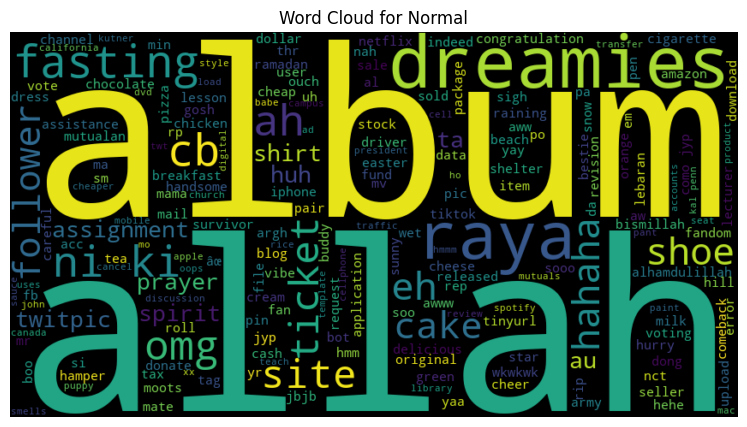

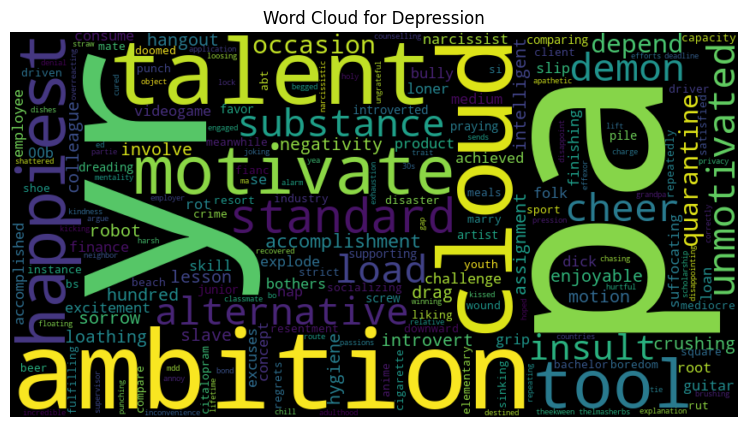

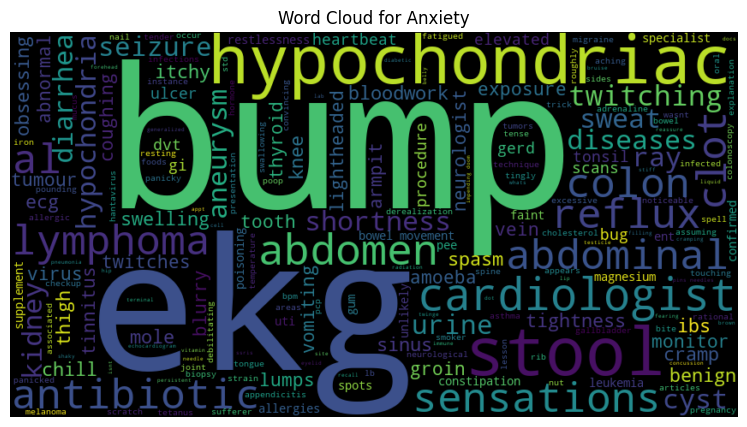

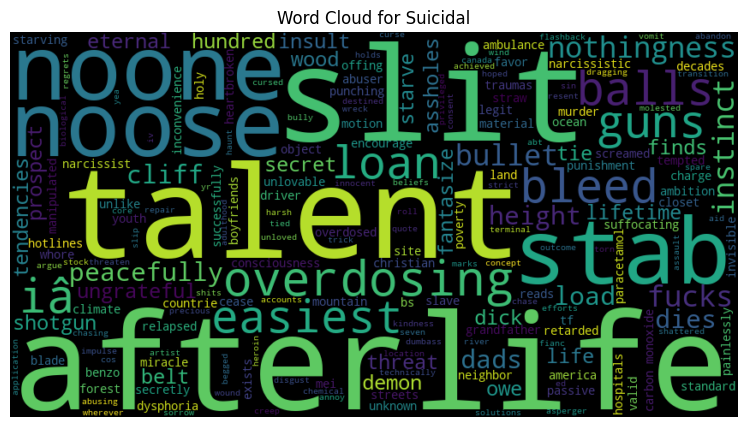

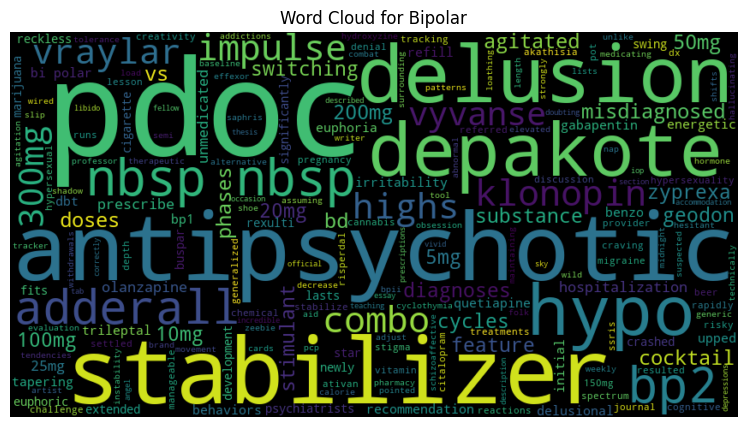

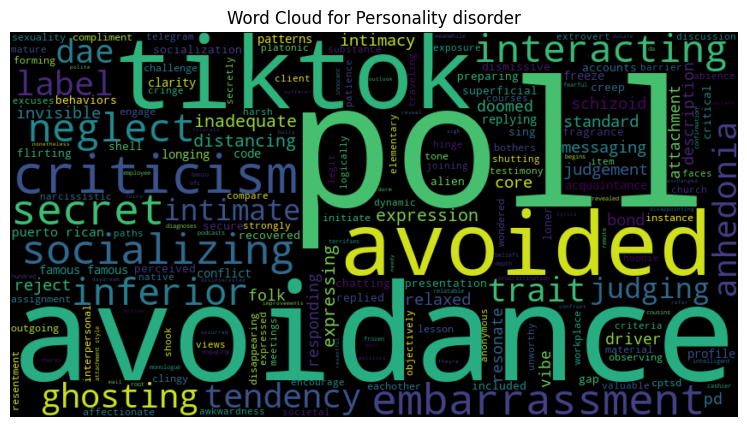

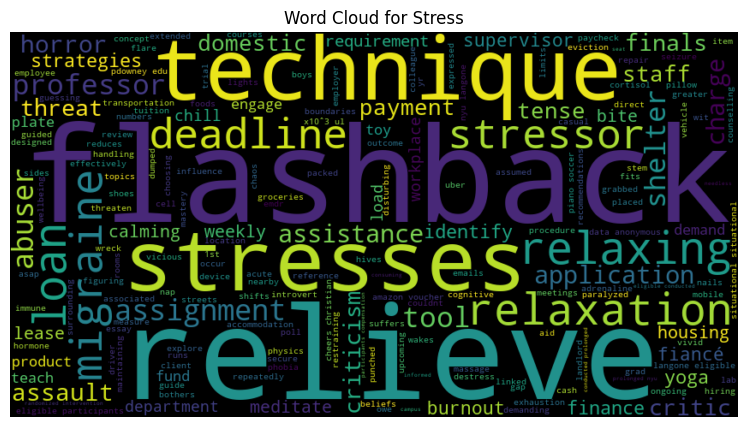

In [15]:
from wordcloud import WordCloud
from collections import Counter

# WordCloud has a built-in stopwords remover but some topic specific words like "feel", "will" and "want" remain.
# Find Common Words Across All Statuses
all_text = ' '.join(mhdf['statement'])  # Combine all text data
word_counts = Counter(all_text.split())
common_words = set([word for word, count in word_counts.items() if count > 100])  # Threshold for "common" words

# Generate Word Clouds Excluding Common Words
def generate_word_cloud(text, title, common):
    # Remove common words from text
    filtered_text = ' '.join([word for word in text.split() if word not in common])
    
    # Generate word cloud
    wordcloud = WordCloud(width=850, height=450).generate(filtered_text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title)
    plt.axis('off')
    plt.show()

# Generate word clouds for each status
labels = mhdf['status'].unique()

for s in labels:
    status_text = ' '.join(mhdf[mhdf['status'] == s]['statement'])
    generate_word_cloud(status_text, title=f'Word Cloud for {s}', common=common_words)
    

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Machine Learning
</div>

In [16]:
# Assigning features and target
X = mhdf['statement']
y = mhdf['status']

In [36]:
# Splitting the data into train and test sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train.shape

(42105,)

<div style="width: 92%; padding: 20px; 
            background: radial-gradient(circle,white, #E6E6FA, #D8BFD8);
            border: 2px solid #C8A2C8; 
            color: #3e1d2b ;
            font-size: 16px;
            border-radius: 15px;
            text-align: left;"> 
   <h3>Feed text into mathematical formulas?</h3>
    <ul>
        <li>Break down long strings into basic parts -> tokens</li>
        <li>Transform tokens into vectors of numbers -> features</li>
    </ul>
</div>

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c;
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Tokenization
</div>

**The Natural Language Toolkit (NLTK) is a widely used, open-source Python library for natural language processing (NLP) tasks. NLTK Automatically Applies the Punkt Algorithm.** 

<div style="width: 95%; padding: 20px; 
            background: radial-gradient(circle,white, #E6E6FA, #D8BFD8);
            border: 2px solid #C8A2C8; 
            color: #3e1d2b ;
            font-size: 16px;
            border-radius: 15px;
            text-align: left;">       
    <p><b>What Punkt Includes:</b></p>
    <ul>
        <li>Pre-trained language models for sentence segmentation and word tokenization in English.</li>
        <li>Rules for handling punctuation in sentences <b>(. , ! ?)</b>.</li>
        <li>Abbreviation handling (e.g., <b>"Mr."</b> or <b>"Dr.Smith"</b> doesn't split into <b>"Dr"  "."  "Smith"</b>).</li>
    </ul>
    <p><b>Stop Words:</b></p>
    <ul>
        <li>The term "stop words" comes from early information retrieval systems. Because they <b>"stop"</b> being considered for indexing or processing.</li>
        <li>Since words like <b>and, the, is</b>, appear frequently but don't contribute meaningful context, removing them reduces computational load and improves relevance in search engines and NLP models.</li>
    </ul>
    <p><b>Porter Stemmer Algorithm:</b></p>
    <ul>
        <li>Porter Stemmer is a rule-based algorithm that reduces words to their root forms by removing suffixes.</li>       
        <li>It follows predefined linguistic rules to strip endings like <b>-ing, -ed, -s</b>, simplifying words for text analysis.<br> Talking → Talk </li>
        <li>It does not focus on derivational suffixes that significantly change word meaning (<b>-less, -ful, -ment, -ness</b>).
</li>
        <li>Removing <b>-less</b> from <b>homeless</b> or <b>-ful</b> from <b>wonderful</b> would alter the word’s semantic meaning, which is why Porter Stemmer leaves them intact.
</li>
    </ul>
</div>

In [18]:
# Splitting text documents into tokens
import nltk 
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

# Download required NLTK data
# nltk.download('punkt')      # For punctuations used in word_tokenize 
# nltk.download('stopwords')  # For stopword list

def simple_tokenizer(text):
    stop_words = set(stopwords.words('english'))    # Define stopwords (English)
    stemmer = PorterStemmer()                       # Initialize the stemmer
    tokens = word_tokenize(text)                    # Tokenize the text   
    filtered_tokens = [word for word in tokens if word.lower() not in stop_words] # Remove stopwords   
    stemmed_tokens = [stemmer.stem(word) for word in filtered_tokens]             # Apply stemming
    return stemmed_tokens

# Example Usage
text = "i.e., running faster makes you stronger Mrs. Williams!"
print(simple_tokenizer(text))

['i.e.', ',', 'run', 'faster', 'make', 'stronger', 'mrs.', 'william', '!']


In [19]:
# Application of tokenizer
X_train_tokens = X_train.apply(simple_tokenizer)
X_test_tokens = X_test.apply(simple_tokenizer)

In [20]:
# View a few vectorised statements
X_train_tokens.head()

186                                    [okay, buddi, okay]
24921    [deserv, suffer, feel, like, meant, feel, mise...
46718    [dont, knwo, anymor, use, hurt, purpos, wonder...
19585    [yeayyyyy, sister, raya, cloth, safe, arriv, v...
21905    [keto, amp, hypomania, anyon, els, experienc, ...
Name: statement, dtype: object

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c;
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Vectorization
</div>

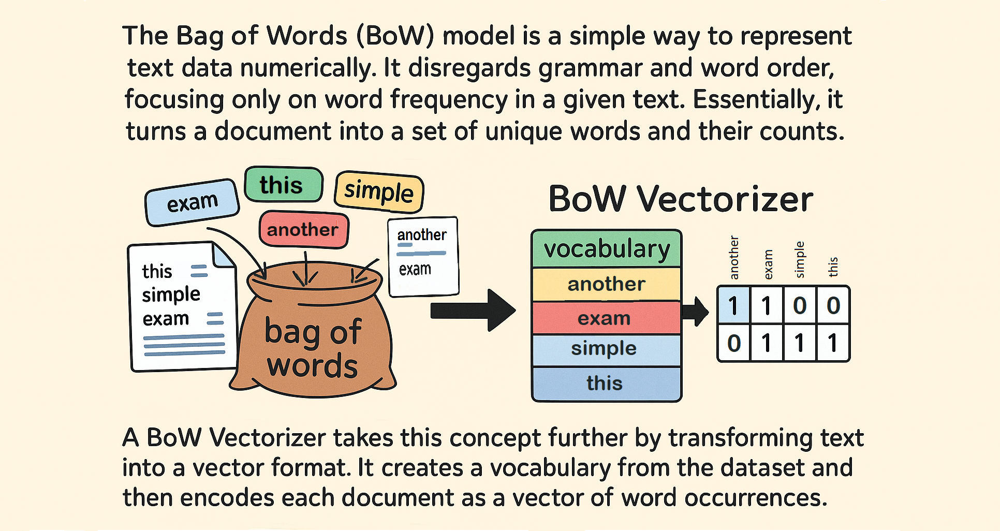

In [21]:
from sklearn.feature_extraction.text import CountVectorizer

# Initializing a vectoriser
bow_vectorizer = CountVectorizer()

# Fitting to the bow-vectorizer
X_train_bow = bow_vectorizer.fit_transform(X_train_tokens.apply(lambda x: ' '.join(x))) # tokens are list of word parts
X_test_bow = bow_vectorizer.transform(X_test_tokens.apply(lambda x: ' '.join(x)))       # vectorizer accepts strings

In [22]:
# Show some of the vocabulary words
bow_vectorizer.get_feature_names_out()[2000:2080]  

array(['advicewhat', 'advil', 'advis', 'advise', 'advisor', 'advoc',
       'advocaci', 'adwanc', 'adz', 'ae', 'aeay', 'aeon', 'aeri', 'aerob',
       'aespa', 'aesthet', 'af', 'af1', 'afaik', 'afar', 'afarid',
       'afast', 'afastado', 'afastamo', 'afdhol', 'afer', 'afew',
       'affair', 'affari', 'affarid', 'affect', 'affection', 'affectioni',
       'affectivw', 'affer', 'affevt', 'affff', 'affili', 'affin',
       'affirm', 'afflict', 'affluenc', 'affluent', 'afford', 'afforment',
       'affraid', 'afghan', 'afghanistan', 'afi', 'afib', 'afkark',
       'aflam', 'afloat', 'aforement', 'afrai', 'afraid', 'afraidi',
       'afraidso', 'afresh', 'africa', 'african', 'afro', 'afstapt',
       'after', 'afteral', 'afterallsorri', 'aftercar', 'afterhyster',
       'afterimag', 'afterlif', 'afterlifey', 'aftermath', 'afternoon',
       'afterrmc', 'aftershock', 'aftertast', 'afterthought', 'afterward',
       'afterword', 'aftl'], dtype=object)

In [23]:
# View the dimensions of the BoW matrix and a small portion of its data
print(X_train_bow.shape)  # (num_samples: documents, num_features: unique tokens)
print(X_train_bow[:5])    # Shows first 5 rows (sparse format: only non-zero elements)

(42105, 37108)
<Compressed Sparse Row sparse matrix of dtype 'int64'
	with 138 stored elements and shape (5, 37108)>
  Coords	Values
  (0, 23508)	2
  (0, 5777)	1
  (1, 9278)	1
  (1, 31273)	1
  (1, 12340)	3
  (1, 19411)	4
  (1, 20689)	1
  (1, 21354)	1
  (1, 33403)	1
  (1, 26352)	1
  (1, 17068)	1
  (1, 13830)	3
  (1, 33372)	1
  (1, 29227)	1
  (1, 22918)	1
  (1, 6290)	1
  (1, 24834)	1
  (1, 34654)	1
  (1, 11610)	1
  (1, 9681)	1
  (1, 33331)	1
  (1, 11602)	1
  (1, 7123)	2
  (1, 15998)	1
  (1, 19575)	1
  :	:
  (3, 35063)	1
  (4, 12340)	1
  (4, 19411)	1
  (4, 32792)	1
  (4, 11651)	1
  (4, 3108)	1
  (4, 18385)	1
  (4, 2721)	1
  (4, 16207)	2
  (4, 10950)	1
  (4, 11849)	1
  (4, 20345)	1
  (4, 12901)	1
  (4, 18387)	1
  (4, 9519)	1
  (4, 36604)	1
  (4, 11620)	1
  (4, 32706)	1
  (4, 16206)	1
  (4, 30768)	1
  (4, 11846)	1
  (4, 36271)	1
  (4, 11929)	1
  (4, 15284)	1
  (4, 32286)	1


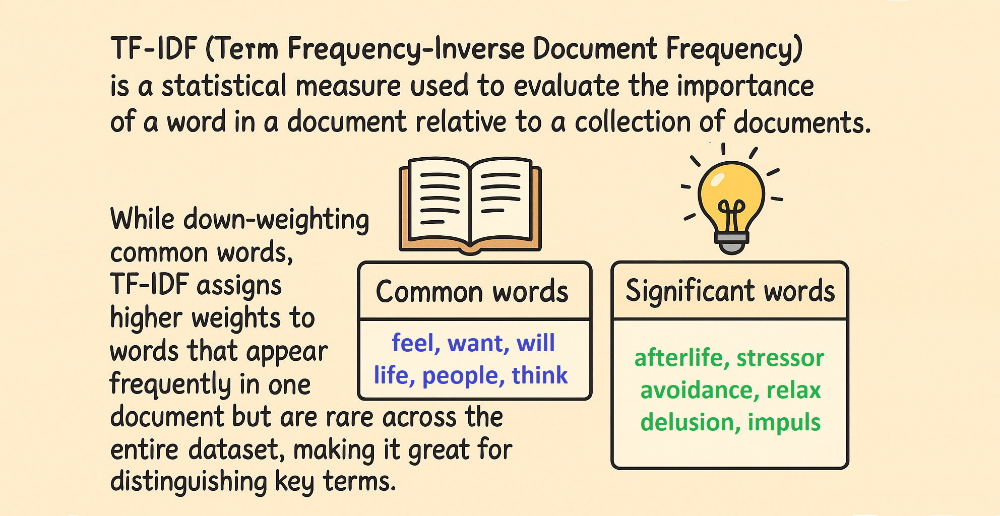

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Define TfidfVectorizer with n-gram range
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2))  # Includes unigrams and bigrams

# Apply TfidfVectorizer to the tokenized data
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train_tokens.apply(lambda x: ' '.join(x)))
X_test_tfidf = tfidf_vectorizer.transform(X_test_tokens.apply(lambda x: ' '.join(x)))

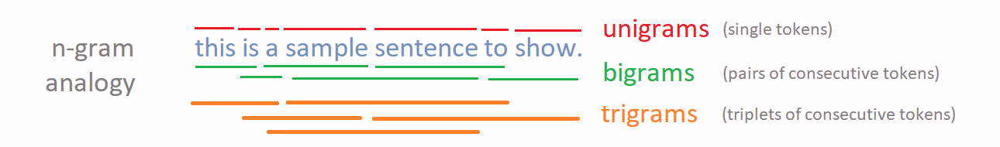

In [25]:
# View Feature Names (Words or N-grams)
print(tfidf_vectorizer.get_feature_names_out()[60100:60150])

['ashleyemma lucki' 'ashleyskyy' 'ashleyskyy want' 'ashman0'
 'ashman0 complaint' 'ashofhom' 'ashofhom byloko' 'ashok' 'ashok hotel'
 'ashwaganda' 'ashwaganda grandfath' 'ashwaganda ocd' 'ashwagandha'
 'ashwagandha 300mg' 'ashwagandha amp' 'ashwagandha avpd'
 'ashwagandha chewabl' 'ashwagandha crap' 'ashwagandha experienc'
 'ashwagandha magnesium' 'ashwagandha mayb' 'ashwagandha sacr'
 'ashwagandha tyrosin' 'ashwagandha week' 'ashwagandha without'
 'ashwaghanda' 'ashwaghanda deprenyl' 'ashwapepp' 'ashwapepp perform'
 'ashwapepp ultim' 'asia' 'asia abus' 'asia album' 'asia best' 'asia cost'
 'asia countri' 'asia depress' 'asia end' 'asia hang' 'asia joke'
 'asia middl' 'asia never' 'asia region' 'asia use' 'asia work'
 'asiacup2017' 'asiacup2017 indvpak' 'asian' 'asian achiev' 'asian boy']


In [26]:
# See the dimensions of the BoW matrix and a small portion of its data
print(X_train_tfidf.shape) # (num_samples: documents, num_features: unique n-grams)
print(X_train_tfidf[:3])   # Shows nonzero TF-IDF scores in the first 3 documents

(42105, 827788)
<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 235 stored elements and shape (3, 827788)>
  Coords	Values
  (0, 513694)	0.47510198104012363
  (0, 109617)	0.395545405112598
  (0, 513772)	0.5373528448765086
  (0, 109649)	0.5736495970618161
  (1, 189383)	0.06946075719719381
  (1, 699057)	0.060965899744287975
  (1, 266260)	0.08925678475194262
  (1, 422132)	0.11830773594893988
  (1, 458790)	0.08210484842126145
  (1, 472326)	0.07452719237284575
  (1, 752366)	0.039433183566901106
  (1, 576152)	0.05565586365996442
  (1, 379580)	0.06929762742785543
  (1, 301939)	0.09633467561944577
  (1, 751424)	0.07246398885747914
  (1, 642969)	0.05383034265699964
  (1, 501689)	0.06880464362031842
  (1, 119151)	0.04988556923387903
  (1, 542247)	0.04902314272780665
  (1, 772597)	0.050502410720216426
  (1, 240906)	0.07398847567956676
  (1, 199346)	0.12236705774730057
  (1, 750321)	0.09343525304098245
  (1, 238558)	0.036910707769627536
  (1, 134871)	0.2627916530401312
  :	:
  (2, 21

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Training Models
</div>

In [27]:
from sklearn.linear_model import LogisticRegression

# Initialize Logistic Regression model
lr_model_bow = LogisticRegression(C=100, solver='saga', max_iter=10000) # saga solver is suitable for sparse matrix
lr_model_tfidf = LogisticRegression(C=100, solver='saga', max_iter=10000)

# Train Logistic Regression on the bag-of-words features
lr_model_bow.fit(X_train_bow, y_train)

# Train Logistic Regression on the TF-IDF features
lr_model_tfidf.fit(X_train_tfidf, y_train)

LogisticRegression(C=100, max_iter=10000, solver='saga')

In [28]:
from sklearn.naive_bayes import MultinomialNB

# Initialize Naïve Bayes model
nb_model_bow = MultinomialNB(alpha=0.1)
nb_model_tfidf = MultinomialNB(alpha=0.1)

# Train Naïve Bayes on the bag-of-words features
nb_model_bow.fit(X_train_bow, y_train)

# Train Naïve Bayes on the TF-IDF features
nb_model_tfidf.fit(X_train_tfidf, y_train)

MultinomialNB(alpha=0.1)

In [29]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest model
rf_model_bow = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf_model_tfidf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)

# Train Random Forest on Bag-of-Words features
rf_model_bow.fit(X_train_bow, y_train)

# Train Random Forest on TF-IDF features
rf_model_tfidf.fit(X_train_tfidf, y_train)

RandomForestClassifier(n_jobs=-1, random_state=42)

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c;
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Making Predictions
</div>

In [30]:
# Logistic Regression
lr_predictions_bow = lr_model_bow.predict(X_test_bow)
lr_predictions_tfidf = lr_model_tfidf.predict(X_test_tfidf)

# Naïve Bayes
nb_predictions_bow = nb_model_bow.predict(X_test_bow)
nb_predictions_tfidf = nb_model_tfidf.predict(X_test_tfidf)

# Random Forest
rf_predictions_bow = rf_model_bow.predict(X_test_bow)
rf_predictions_tfidf = rf_model_tfidf.predict(X_test_tfidf)

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Evaluating Models
</div>

In [31]:
from sklearn.metrics import accuracy_score

print("Logistic Regression (BoW):")
print("Accuracy:", accuracy_score(y_test, lr_predictions_bow))

print("\nLogistic Regression (TF-IDF):")
print("Accuracy:", accuracy_score(y_test, lr_predictions_tfidf))

print("\nNaïve Bayes (BoW):")
print("Accuracy:", accuracy_score(y_test, nb_predictions_bow))

print("\nNaïve Bayes (TF-IDF):")
print("Accuracy:", accuracy_score(y_test, nb_predictions_tfidf))

print("\nRandom Forest (BoW):")
print("Accuracy:", accuracy_score(y_test, rf_predictions_bow))

print("\nRandom Forest (TF-IDF):")
print("Accuracy:", accuracy_score(y_test, rf_predictions_tfidf))

Logistic Regression (BoW):
Accuracy: 0.7148285361451505

Logistic Regression (TF-IDF):
Accuracy: 0.7574807637503562

Naïve Bayes (BoW):
Accuracy: 0.6601120927139736

Naïve Bayes (TF-IDF):
Accuracy: 0.5684430512016719

Random Forest (BoW):
Accuracy: 0.6770209936354137

Random Forest (TF-IDF):
Accuracy: 0.6449130806497577


In [32]:
from sklearn.metrics import classification_report
print("Performance of Logistic Regression on TF-IDF:\n", classification_report(y_test, lr_predictions_tfidf))

Performance of Logistic Regression on TF-IDF:
                       precision    recall  f1-score   support

             Anxiety       0.79      0.80      0.79       767
             Bipolar       0.87      0.72      0.79       555
          Depression       0.67      0.74      0.70      3076
              Normal       0.89      0.91      0.90      3268
Personality disorder       0.90      0.60      0.72       215
              Stress       0.71      0.45      0.55       517
            Suicidal       0.65      0.62      0.64      2129

            accuracy                           0.76     10527
           macro avg       0.78      0.69      0.73     10527
        weighted avg       0.76      0.76      0.76     10527



<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 44px;    
            border-radius: 10px;">
    Visualising with Confusion Matrix
</div>

In [33]:
from sklearn.metrics import confusion_matrix
# Define a custom confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name, feature_type, class_names):
    cm = confusion_matrix(y_true, y_pred, labels=class_names)  
    plt.figure(figsize=(6,4))
    
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=class_names, yticklabels=class_names)
    
    plt.xlabel('Predicted Status')
    plt.ylabel('True Status')
    plt.title(f'Confusion Matrix for {model_name} ({feature_type})')
    plt.show()

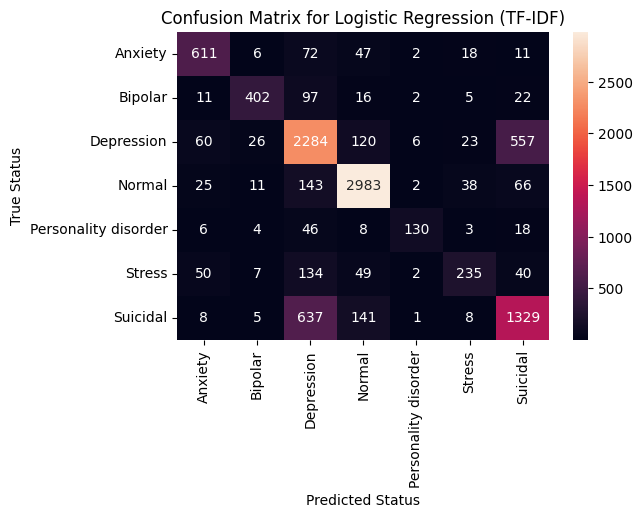

In [34]:
# Get class labels in order from the trained model
statuses = lr_model_tfidf.classes_  
# Plot confusion matrix
plot_confusion_matrix(y_test, lr_predictions_tfidf, 
                      model_name="Logistic Regression", feature_type="TF-IDF", 
                      class_names=statuses)

<div style="width: 90%; padding: 20px; 
            background: radial-gradient(circle, #e0e0e0, #b8b8b8, teal);
            color: #004c4c; 
            border: 2px solid #004c4c;
            text-align: center;
            font-weight: bold;
            font-size: 36px;    
            border-radius: 10px;">
    Testing Models on Text Samples
</div>

In [35]:
#text = "It's all right."
#text = 'anyone else has final exams tomorrow?'
#text = 'Are you waiting to get home to your pile of chores?'
### The little prince, Antoine de Saint-Exupéry
# text = """And now here is my secret, a very simple secret: 
#         It is only with the heart that one can see rightly; what is essential is invisible to the eye. 
#         It is the time you have wasted for your rose that makes your rose so important."""
### Hamlet, Shakespeare
text = 'Doubt thou the stars are fire; Doubt that the sun doth move; Doubt truth to be a liar; But never doubt I love.'

# Preprocess and tokenize
sample = ' '.join(simple_tokenizer(cleaner(text)))  # Convert tokens back to a single string

# Transform the text using the trained vectorizers
sample_bow = bow_vectorizer.transform([sample])  # Bag-of-Words
sample_tfidf = tfidf_vectorizer.transform([sample])  # TF-IDF

# Logistic Regression
lr_pred_bow = lr_model_bow.predict(sample_bow)
lr_pred_tfidf = lr_model_tfidf.predict(sample_tfidf)

# Naïve Bayes
nb_pred_bow = nb_model_bow.predict(sample_bow)
nb_pred_tfidf = nb_model_tfidf.predict(sample_tfidf)

# Random Forest
rf_pred_bow = rf_model_bow.predict(sample_bow)
rf_pred_tfidf = rf_model_tfidf.predict(sample_tfidf)

print('Logistig Regression, Bag-of-Words:    ', lr_pred_bow)
print('Logistig Regression, TF-IDF:          ', lr_pred_tfidf)
print('Multinomial Naïve Bayes, Bag-of-Words:', nb_pred_bow)
print('Multinomial Naïve Bayes, TF-IDF:      ', nb_pred_tfidf)
print('Random Forest, Bag-of-Words:          ', rf_pred_bow)
print('Random Forest, TF-IDF:                ', rf_pred_tfidf)

Logistig Regression, Bag-of-Words:     ['Normal']
Logistig Regression, TF-IDF:           ['Normal']
Multinomial Naïve Bayes, Bag-of-Words: ['Normal']
Multinomial Naïve Bayes, TF-IDF:       ['Depression']
Random Forest, Bag-of-Words:           ['Normal']
Random Forest, TF-IDF:                 ['Normal']


<img src="thanks.gif" width="900" height="350">